In [1]:
import sys
sys.path.append("..")
import shap
import xgboost
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import numpy as np
import colorsys
from sklearn.decomposition import PCA
from sklearn.metrics.pairwise import manhattan_distances
from sklearn.model_selection import train_test_split

In [2]:
shap.initjs()

In [3]:
notebook_mode = 'Original-NC'
explainer_type = 'XGBoost'
model_type = 'Linear'

In [4]:
# train XGBoost model
X,y = shap.datasets.communitiesandcrime()
X = X.reset_index()
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=0)
from sklearn.linear_model import LinearRegression
#model = LinearRegression().fit(X, y)
model = xgboost.train({"learning_rate": 0.01}, xgboost.DMatrix(X, label=y), 100)

In [5]:
X_instanced = pd.concat((X,pd.DataFrame(columns = ['instance'])),axis = 1)
X_instanced['instance'].loc[X_train.index] = 'train'
X_instanced['instance'].loc[X_test.index] = 'test'
y_instanced = pd.concat((pd.DataFrame(y),pd.DataFrame(columns = ['instance'])),axis = 1)
y_instanced['instance'].loc[X_train.index] = 'train'
y_instanced['instance'].loc[X_test.index] = 'test'

C:\Users\koral\Anaconda3\lib\site-packages\pandas\core\indexing.py:189: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._setitem_with_indexer(indexer, value)


In [6]:
# explain the model's predictions using SHAP values
# (same syntax works for LightGBM, CatBoost, and scikit-learn models)
#explainer = shap.LinearExplainer(model,X)
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X)
shap_instanced = pd.concat((pd.DataFrame(shap_values),pd.DataFrame(columns = ['instance'])),axis = 1)
shap_instanced['instance'].loc[X_train.index] = 'train'
shap_instanced['instance'].loc[X_test.index] = 'test'

In [7]:
# visualize the first prediction's explanation (use matplotlib=True to avoid Javascript)
shap.force_plot(explainer.expected_value, shap_values[0,:], X.iloc[0,:])

In [8]:
# visualize the training set predictions
shap.force_plot(explainer.expected_value, shap_values, X)

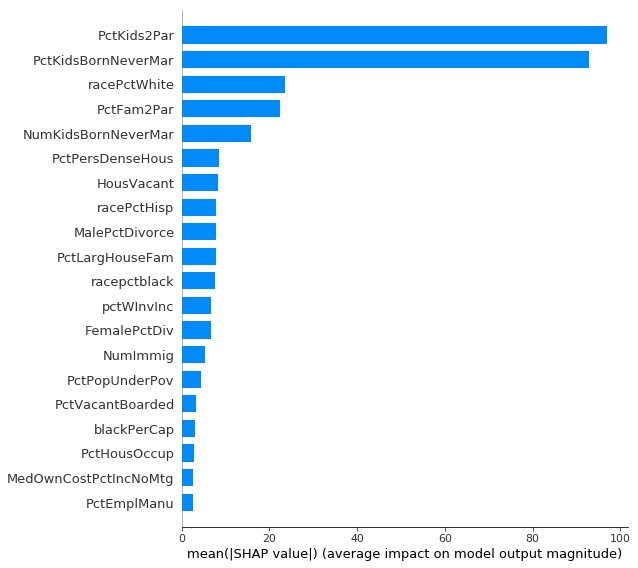

In [9]:
# summarize the effects of all the features
shap.summary_plot(shap_values, X,plot_type = 'bar')

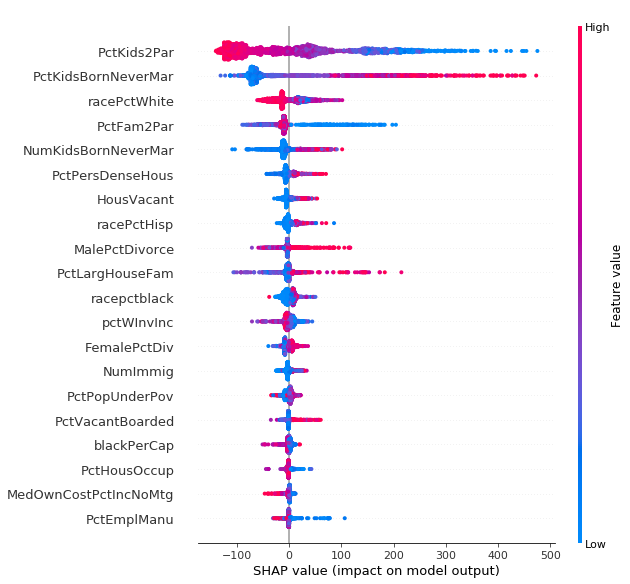

In [10]:
# summarize the effects of all the features
shap.summary_plot(shap_values, X)

In [11]:
#Gather shapley values and output values in one dataframe
shap_dataframe = pd.DataFrame(data = shap_values,columns = X.columns)
output_dataframe = pd.DataFrame(data = y,columns = ['crimes'])
shap_dataframe = pd.concat([shap_dataframe,output_dataframe],axis = 1)

In [12]:
#Make interaction plot for all features
#shap_interaction_values = explainer.shap_interaction_values(X)
#shap.summary_plot(shap_interaction_values, X, max_display = 10)

C:\Users\koral\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


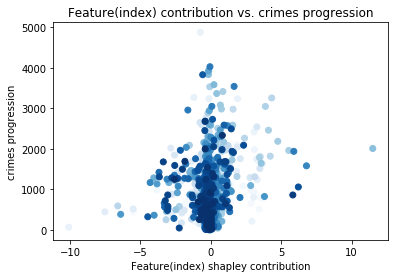

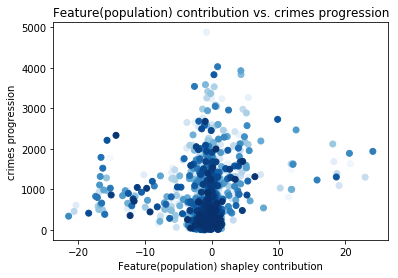

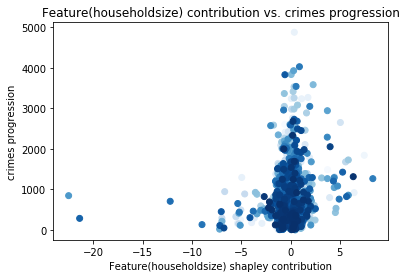

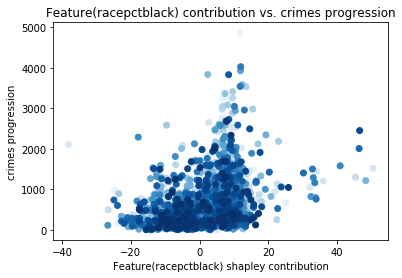

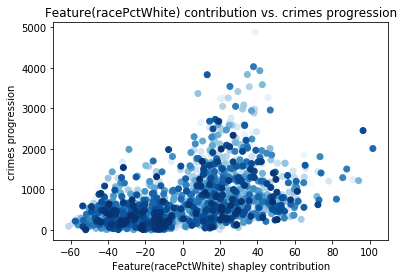

...

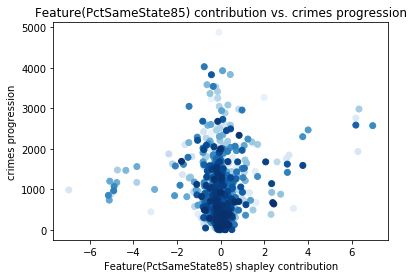

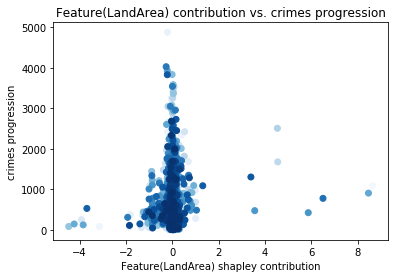

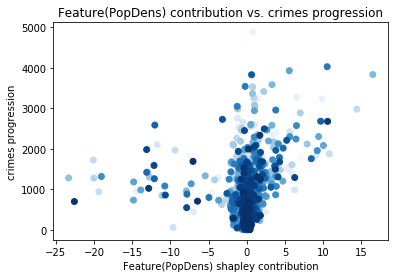

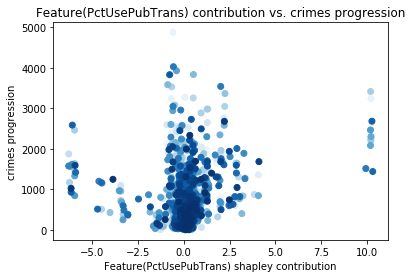

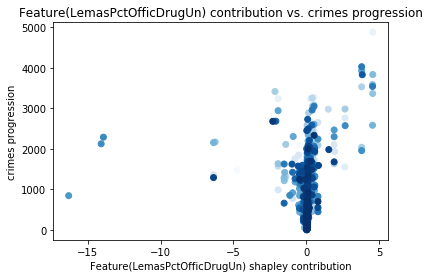

In [13]:
from Framework import plotHelper
plotHelper.plotAllFeatures(shap_dataframe)

In [14]:
#Start clustering
from Framework import cluster
from sklearn.cluster import KMeans
nClusters = 1
#Train KMeans, because the data is unsupervised(Regression data)
#kmeans = KMeans(n_clusters=3, random_state=0).fit(shap_values)
kmeans = cluster.clusterData(KMeans(n_clusters=nClusters, random_state=0).fit,shap_values)

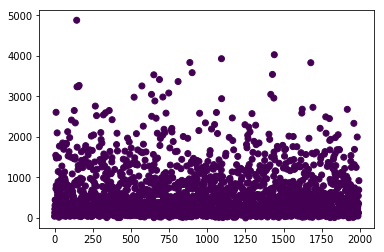

In [15]:
#Get the labels, concat into original data, and sor the labels for into cluster groups
shap_dataframe_labeled = pd.concat([shap_dataframe,pd.DataFrame(kmeans.labels_,columns =[ 'labels'])],axis = 1)
#shap_grouped = shap_dataframe_labeled.sort_values(['labels'])
X_labeled = pd.concat([X,shap_dataframe_labeled['labels']], axis = 1)
plt.scatter(np.linspace(0,len(X),len(X)),y,c = X_labeled['labels'])

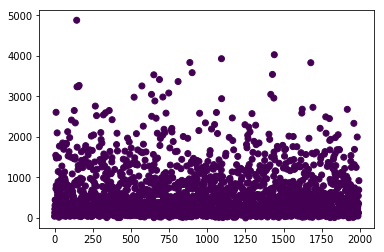

In [16]:
kmeans_original = cluster.clusterData(KMeans(n_clusters=nClusters, random_state=0).fit,X)
plt.scatter(np.arange(len(X)),y,c = kmeans_original.labels_)

In [17]:
#Split the clusters into a dictionary
data_dict = cluster.splitDataLabeled(nClusters,shap_dataframe,shap_dataframe_labeled['labels'])
data_dict_original = cluster.splitDataLabeled(nClusters,X,kmeans_original.labels_)

In [18]:
shap_instanced = pd.concat((pd.DataFrame(shap_values),pd.DataFrame(columns = ['instance'])),axis = 1)
shap_instanced['instance'].loc[X_train.index] = 'train'
shap_instanced['instance'].loc[X_test.index] = 'test'


if notebook_mode == 'Original' or notebook_mode == 'Original-NC':
    original_split = cluster.convertOriginalData(data_dict_original,X_instanced,y_instanced)
    original_split_shapley = cluster.convertOriginalData(data_dict,X_instanced,y_instanced)
elif notebook_mode =='Shapley' or notebook_mode == 'Shapley-NC':
    original_split = cluster.convertOriginalData(data_dict_original,X_instanced,y_instanced)
    original_split_shapley = cluster.convertOriginalData(data_dict,shap_instanced,y_instanced)
else:
    print('Error!')

C:\Users\koral\Anaconda3\lib\site-packages\pandas\core\indexing.py:189: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._setitem_with_indexer(indexer, value)


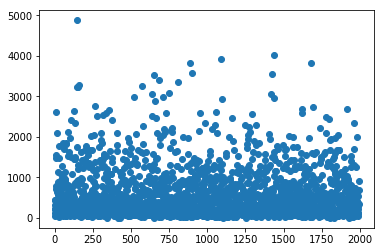

In [19]:
#Scatter the groups again...
#plt.scatter(np.linspace(-1,1,len(original_label_cluster2)),cluster2_predictions)
plt.scatter(np.arange(len(original_split['original_label_cluster0'])),original_split['original_label_cluster0'].iloc[:,0])
#plt.scatter(np.arange(len(original_split['original_label_cluster1'])),original_split['original_label_cluster1'].iloc[:,0])
#plt.scatter(np.arange(len(original_split['original_label_cluster2'])),original_split['original_label_cluster2'].iloc[:,0])

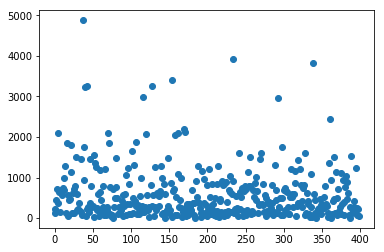

In [20]:
plt.scatter(np.arange(len(original_split_shapley['original_test_label_cluster0'])),original_split_shapley['original_test_label_cluster0'].iloc[:,0])
#plt.scatter(np.arange(len(original_split_shapley['original_test_label_cluster1'])),original_split_shapley['original_test_label_cluster1'].iloc[:,0])
#plt.scatter(np.arange(len(original_split_shapley['original_test_label_cluster2'])),original_split_shapley['original_test_label_cluster2'].iloc[:,0])

In [21]:
#Train split XGBoost models over original data
params = {
    "eta": 0.05,
    "max_depth": 1,
    "objective": "reg:squarederror",
    "subsample": 0.5,
    "base_score": np.mean(y),
    "eval_metric": "rmse"
}

eval_results = {}
kwargs = {
    'num_boost_round':10000,
    'verbose_eval': 1000,
    'evals_result' : {},
    'early_stopping_rounds' : 200
}

#model_dict,eval_results = cluster.trainMultipleModels(xgboost.train,original_split,'XGBoost',params,**kwargs)
model_dict,eval_results = cluster.trainMultipleModels(LinearRegression().fit,original_split,'LinearRegressor',params)
#small_model_1 = xgboost.train(params,xgboost.DMatrix(original_split['original_data_cluster0'], label=original_split['original_label_cluster0']),20000,evals = [(xgboost.DMatrix(original_split['original_data_cluster0'], label=original_split['original_label_cluster0']), "train")] ,verbose_eval = 1000)
#small_model_2 = xgboost.train(params,xgboost.DMatrix(original_split['original_data_cluster1'], label=original_split['original_label_cluster1']),20000,evals = [(xgboost.DMatrix(original_split['original_data_cluster1'], label=original_split['original_label_cluster1']), "train")] ,verbose_eval = 1000)
#small_model_3 = xgboost.train(params,xgboost.DMatrix(original_split['original_data_cluster2'], label=original_split['original_label_cluster2']),20000,evals = [(xgboost.DMatrix(original_split['original_data_cluster2'], label=original_split['original_label_cluster2']), "train")] ,verbose_eval = 1000)

In [22]:
eval_results

{'eval0': {'train': {'rmse': 0    339.465299
   dtype: float64}, 'test': {'rmse': 0    480.218923
   dtype: float64}}}

In [23]:
#Train split XGBoost models over original data
params = {
    "eta": 0.05,
    "max_depth": 1,
    "objective": "reg:squarederror",
    "subsample": 0.5,
    "base_score": np.mean(y),
    "eval_metric": "rmse"
}
eval_results_shapley = {}
kwargs = {
    'num_boost_round':10000,
    'verbose_eval': 1000,
    'evals_result' : {},
    'early_stopping_rounds' : 200
}
#model_dict_shapley,eval_results_shapley = cluster.trainMultipleModels(xgboost.train,original_split_shapley,'XGBoost',params,**kwargs)
model_dict_shapley,eval_results_shapley = cluster.trainMultipleModels(LinearRegression().fit,original_split_shapley,'LinearRegressor',params)
#small_model_shapley1 = xgboost.train(params,xgboost.DMatrix(original_split_shapley['original_data_cluster0'], label=original_split_shapley['original_label_cluster0']),20000,evals = [(xgboost.DMatrix(original_split_shapley['original_data_cluster0'], label=original_split_shapley['original_label_cluster0']), "train")] ,verbose_eval = 1000)
#small_model_shapley2 = xgboost.train(params,xgboost.DMatrix(original_split_shapley['original_data_cluster1'], label=original_split_shapley['original_label_cluster1']),20000,evals = [(xgboost.DMatrix(original_split_shapley['original_data_cluster1'], label=original_split_shapley['original_label_cluster1']), "train")] ,verbose_eval = 1000)
#small_model_shapley3 = xgboost.train(params,xgboost.DMatrix(original_split_shapley['original_data_cluster2'], label=original_split_shapley['original_label_cluster2']),20000,evals = [(xgboost.DMatrix(original_split_shapley['original_data_cluster2'], label=original_split_shapley['original_label_cluster2']), "train")] ,verbose_eval = 1000)

In [24]:
eval_results_shapley

{'eval0': {'train': {'rmse': 0    156.768637
   dtype: float64}, 'test': {'rmse': 0    198.85973
   dtype: float64}}}

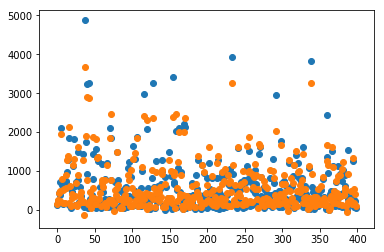

In [25]:
#preds =model.predict(xgboost.DMatrix(original_split['original_data_cluster0']))
plt.scatter(np.arange(len(original_split_shapley['original_test_label_cluster0'])),original_split_shapley['original_test_label_cluster0'])
plt.scatter(np.arange(len(original_split_shapley['original_test_label_cluster0'])),model_dict_shapley['model0'].predict(original_split_shapley['original_test_cluster0']))

In [26]:
#Train overall model
ev_result = {}
params = {
    "eta": 0.05,
    "max_depth": 1,
    "objective": "reg:squarederror",
    "subsample": 0.5,
    "base_score": np.mean(y),
    "eval_metric": "rmse",
}
model = xgboost.train(params,xgboost.DMatrix(X_train, label=y_train),10000,evals = [(xgboost.DMatrix(X_train, label=y_train), "train"),(xgboost.DMatrix(X_test, label=y_test), "test")] ,verbose_eval = 1000,evals_result = ev_result,early_stopping_rounds = 200)
tot_result_big_model = min(ev_result['test']['rmse'])

[0]	train-rmse:592.014	test-rmse:649.553
Multiple eval metrics have been passed: 'test-rmse' will be used for early stopping.

Will train until test-rmse hasn't improved in 200 rounds.
Stopping. Best iteration:
[339]	train-rmse:321.056	test-rmse:386.736



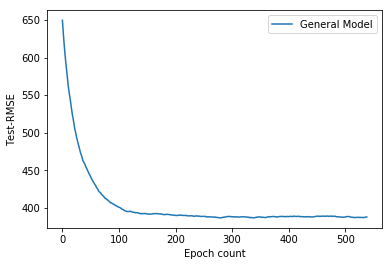

In [27]:
plt.plot(np.arange(len(ev_result['test']['rmse'])),ev_result['test']['rmse'])
plt.xlabel('Epoch count')
plt.ylabel('Test-RMSE')
plt.legend(['General Model'])

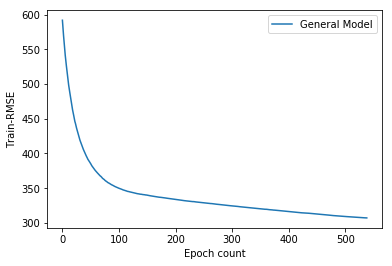

In [28]:
plt.plot(np.arange(len(ev_result['train']['rmse'])),ev_result['train']['rmse'])
plt.xlabel('Epoch count')
plt.ylabel('Train-RMSE')
plt.legend(['General Model'])

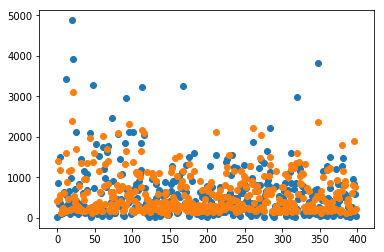

In [29]:
plt.scatter(np.arange(len(X_test)),y_test)
plt.scatter(np.arange(len(X_test)),model.predict(xgboost.DMatrix(X_test)))

In [30]:
#Evaluation of results
from Framework import metrics
sizes = []
rmse_array = []
for i in range(nClusters):
    sizes.append(len(original_split['original_test_label_cluster{0}'.format(i)]))
    rmse_array.append(min(eval_results['eval{0}'.format(i)]['test']['rmse']))
tot_rmse_org = metrics.ensembleRMSE(sizes,rmse_array)

sizes = []
rmse_array = []
for i in range(nClusters):
    sizes.append(len(original_split_shapley['original_test_label_cluster{0}'.format(i)]))
    rmse_array.append(min(eval_results_shapley['eval{0}'.format(i)]['test']['rmse']))
tot_rmse_shap = metrics.ensembleRMSE(sizes,rmse_array)

In [31]:
#Do PCA for dimensionality reduction
nPcaComponents = 2
pca = PCA(n_components=nPcaComponents)
shap_values_pca = pca.fit_transform(shap_values)
print(pca.explained_variance_ratio_.sum())

0.8852085


In [32]:
#Do PCA for dimensionality reduction
nPcaComponents = 2
pca_org = PCA(n_components=nPcaComponents)
org_values_pca = pca_org.fit_transform(X)
print(pca_org.explained_variance_ratio_.sum())

0.9840700295360719


Text(0, 0.5, 'Second principal component')

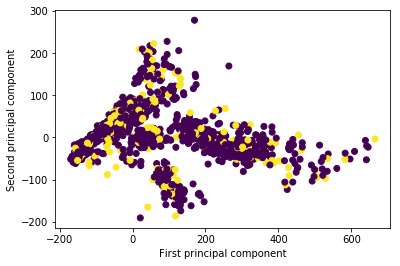

In [33]:
#PCA Clusters are quite seperate,could be used in clustering
label_colors = [ 0 if a == 'train' else 1 for a in X_instanced['instance']]
plt.scatter(shap_values_pca[:,0],shap_values_pca[:,1], c = label_colors)
plt.xlabel('First principal component')
plt.ylabel('Second principal component')
#Add to labels to the scatter plot (Colors)
#How do we interpret this ?

In [34]:
kmeans_pca = cluster.clusterData(KMeans(n_clusters=nPcaComponents, random_state=0).fit,shap_values_pca)
kmeans_org_pca = cluster.clusterData(KMeans(n_clusters=nPcaComponents, random_state=0).fit,org_values_pca)

Text(0, 0.5, 'Second principal component')

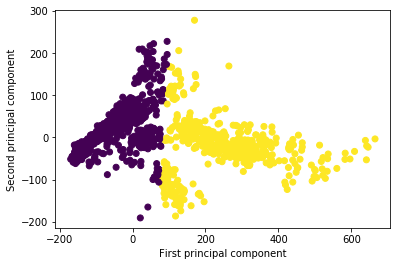

In [35]:
plt.scatter(shap_values_pca[:,0],shap_values_pca[:,1], c = kmeans_pca.labels_)
plt.xlabel('First principal component')
plt.ylabel('Second principal component')

In [36]:
data_dict_shap_pca = cluster.splitDataLabeled(2,shap_values_pca,kmeans_pca.labels_)
data_dict_org_pca = cluster.splitDataLabeled(2,org_values_pca,kmeans_org_pca.labels_)

In [37]:
pca_instanced = pd.concat((pd.DataFrame(org_values_pca),pd.DataFrame(columns = ['instance'])),axis = 1)
pca_instanced['instance'].loc[X_train.index] = 'train'
pca_instanced['instance'].loc[X_test.index] = 'test'
shap_pca_instanced = pd.concat((pd.DataFrame(shap_values_pca),pd.DataFrame(columns = ['instance'])),axis = 1)
shap_pca_instanced['instance'].loc[X_train.index] = 'train'
shap_pca_instanced['instance'].loc[X_test.index] = 'test'

C:\Users\koral\Anaconda3\lib\site-packages\pandas\core\indexing.py:189: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._setitem_with_indexer(indexer, value)


In [38]:
original_shap_pca = cluster.convertOriginalData(data_dict_shap_pca,shap_pca_instanced,y_instanced)
original_pca = cluster.convertOriginalData(data_dict_org_pca,pca_instanced,y_instanced)
original_pca

{'original_data_cluster0':                   0              1 instance
 0     -46796.810579  273930.310298    train
 1     -36046.552117   85005.575454     test
 2     -30866.381455  -48850.040819    train
 3     -61527.085282 -122818.404913    train
 4     123699.366159 -118971.352566    train
 5     -27592.024668  110441.274637     test
 6       9393.357676 -145673.434576     test
 7      31155.204972  -84656.662223    train
 8      73823.720387 -131375.767322    train
 9     -28870.004157 -117310.329708     test
 10    -33909.210330   -5199.262455    train
 11    -43563.329288 -101262.249658    train
 12      7210.295169 -136952.296509    train
 13     -7458.630400   38734.191413    train
 14    208074.895197  439580.351799     test
 15    -49702.358729    4120.969943    train
 16    295172.978423  -66257.528434    train
 18    -30747.132321   85404.761414     test
 19    -61748.049482    1141.585636     test
 20    -50159.420211  -78321.817677    train
 21    -55768.892299 -106270.

In [39]:
#Train split XGBoost models over original data
params = {
    "eta": 0.05,
    "max_depth": 1,
    "objective": "reg:squarederror",
    "subsample": 0.5,
    "base_score": np.mean(y),
    "eval_metric": "rmse"
}
eval_results_org_pca = {}
kwargs = {
    'num_boost_round':10000,
    'verbose_eval': 1000,
    'evals_result' : {},
    'early_stopping_rounds' : 200
}
model_dict_org_pca,eval_results_org_pca = cluster.trainMultipleModels(xgboost.train,original_pca,'XGBoost',params,**kwargs)

[0]	train-rmse:597.92	test-rmse:652.623
Multiple eval metrics have been passed: 'test-rmse' will be used for early stopping.

Will train until test-rmse hasn't improved in 200 rounds.
Stopping. Best iteration:
[568]	train-rmse:515.942	test-rmse:580.607

[0]	train-rmse:1825.69	test-rmse:1508.63
Multiple eval metrics have been passed: 'test-rmse' will be used for early stopping.

Will train until test-rmse hasn't improved in 200 rounds.
Stopping. Best iteration:
[140]	train-rmse:318.233	test-rmse:1.1731



In [40]:
#Train split XGBoost models over original data
params = {
    "eta": 0.05,
    "max_depth": 1,
    "objective": "reg:squarederror",
    "subsample": 0.5,
    "base_score": np.mean(y),
    "eval_metric": "rmse"
}
eval_results_shap_pca = {}
kwargs = {
    'num_boost_round':10000,
    'verbose_eval': 1000,
    'evals_result' : {},
    'early_stopping_rounds' : 200
}
model_dict_shap_pca,eval_results_shap_pca = cluster.trainMultipleModels(xgboost.train,original_shap_pca,'XGBoost',params,**kwargs)

[0]	train-rmse:381.425	test-rmse:387.324
Multiple eval metrics have been passed: 'test-rmse' will be used for early stopping.

Will train until test-rmse hasn't improved in 200 rounds.
Stopping. Best iteration:
[135]	train-rmse:227.005	test-rmse:227.068

[0]	train-rmse:965.983	test-rmse:1136.55
Multiple eval metrics have been passed: 'test-rmse' will be used for early stopping.

Will train until test-rmse hasn't improved in 200 rounds.
Stopping. Best iteration:
[341]	train-rmse:385.696	test-rmse:479.031



In [41]:
sizes = []
rmse_array = []
for i in range(nPcaComponents):
    sizes.append(len(original_shap_pca['original_test_label_cluster{0}'.format(i)]))
    rmse_array.append(min(eval_results_shap_pca['eval{0}'.format(i)]['test']['rmse']))
tot_rmse_shap_pca = metrics.ensembleRMSE(sizes,rmse_array)

sizes = []
rmse_array = []
for i in range(2):
    sizes.append(len(original_pca['original_test_label_cluster{0}'.format(i)]))
    rmse_array.append(min(eval_results_org_pca['eval{0}'.format(i)]['test']['rmse']))
tot_rmse_org_pca = metrics.ensembleRMSE(sizes,rmse_array)

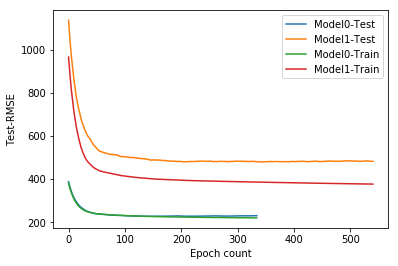

In [42]:
plt.plot(np.arange(len(eval_results_shap_pca['eval0']['test']['rmse'])),eval_results_shap_pca['eval0']['test']['rmse'])
plt.plot(np.arange(len(eval_results_shap_pca['eval1']['test']['rmse'])),eval_results_shap_pca['eval1']['test']['rmse'])
plt.plot(np.arange(len(eval_results_shap_pca['eval0']['train']['rmse'])),eval_results_shap_pca['eval0']['train']['rmse'])
plt.plot(np.arange(len(eval_results_shap_pca['eval1']['train']['rmse'])),eval_results_shap_pca['eval1']['train']['rmse'])
plt.xlabel('Epoch count')
plt.ylabel('Test-RMSE')
plt.legend(['Model0-Test','Model1-Test','Model0-Train','Model1-Train'])

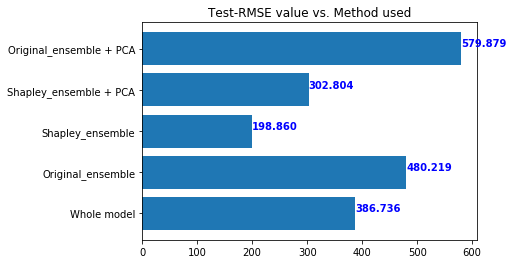

In [43]:
ax = plt.figure()
plt.barh(['Whole model','Original_ensemble','Shapley_ensemble','Shapley_ensemble + PCA','Original_ensemble + PCA'],[tot_result_big_model,tot_rmse_org,tot_rmse_shap,tot_rmse_shap_pca,tot_rmse_org_pca])
plt.title('Test-RMSE value vs. Method used')
for i,v in enumerate([tot_result_big_model,tot_rmse_org,tot_rmse_shap,tot_rmse_shap_pca,tot_rmse_org_pca]):
    plt.text(v , i + .05, '{0:.3f}'.format(v), color='blue', fontweight='bold')

In [44]:
names = ['Whole model','Original_ensemble','Shapley_ensemble','Shapley_ensemble + PCA','Original_ensemble + PCA']
values = [tot_result_big_model,tot_rmse_org,tot_rmse_shap,tot_rmse_shap_pca,tot_rmse_org_pca]
f=open("../Data/test_results.txt", "a+")
f.write('Crime,')
[f.write('{0:.3f},'.format(values[v])) for v in range(len(values))]
f.write('{0},'.format(notebook_mode))
f.write('{0},'.format(explainer_type))
f.write('{0}'.format(model_type))
f.write('\n')
f.close()